---
# Bescktestando Estratégias de Trading - RSI (IFR)
---

- Um backtest deve ser encarado como uma função que recebe parâmetros (da estratégia, janela temporal, custos, slippage) e devolve trades executados.

- Neste Backtest iremos verificar se o indicdor **RSI** seria um bom indicador para encontrar oportunidades de trades mo ativo **PETR4** (ações preferenciais de Perobras)

## 1. Obtenção dos dados

Para obtenção dos dados poderia ser utilizada uma API ou a leitura de um arquivo .CSV

- API Trading View

In [1]:
# from tvDatafeed import TvDatafeed, Interval
# from datetime import datetime, timedelta
# import pandas as pd

# username = 'nome.ususario'
# password = open('pass', 'r').read()

# tv = TvDatafeed(username, password)

# df = tv.get_hist(symbol='PETR4',exchange='BMFBOVESPA',interval=Interval.in_5_minute, n_bars= 5000)

- Leitura de arquivo .CSV

In [2]:
from datetime import datetime, timedelta
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv('petr4.csv')
df.set_index("datetime", inplace=True)

In [4]:
df

,symbol,open,high,low,close,volume
datetime,,,,,,
2022-08-24 17:35:00,BMFBOVESPA:PETR4,33.62,33.62,33.58,33.58,20000.0
2022-08-24 17:40:00,BMFBOVESPA:PETR4,33.58,33.60,33.58,33.58,16100.0
2022-08-24 17:45:00,BMFBOVESPA:PETR4,33.59,33.62,33.58,33.59,38700.0
2022-08-24 17:50:00,BMFBOVESPA:PETR4,33.58,33.59,33.53,33.55,65700.0
2022-08-24 17:55:00,BMFBOVESPA:PETR4,33.55,33.65,33.54,33.56,164800.0
...,...,...,...,...,...,...
2022-11-16 14:50:00,BMFBOVESPA:PETR4,27.56,27.57,27.45,27.49,1347500.0
2022-11-16 14:55:00,BMFBOVESPA:PETR4,27.49,27.53,27.46,27.51,510900.0
2022-11-16 15:00:00,BMFBOVESPA:PETR4,27.51,27.52,27.41,27.45,1034700.0


In [5]:
def plot_candlestick(df):
    fig = go.Figure(data=[go.Candlestick(x=df.index,
                                         open=df['open'],
                                         high=df['high'],
                                         low=df['low'],
                                         close=df['close'])])
    
    fig.update_xaxes(rangebreaks=[
        dict(bounds=[18, 10], pattern="hour"),  # hide hours outside of 9am-5pm
        dict(bounds=["sat", "mon"]),  # hide weekends
    ])
    
    fig.update_layout(xaxis_rangeslider_visible=False, height=500)
    fig.show()

In [6]:
plot_candlestick(df)

---
## 2. Cálculo do RSI


O RSI ou Relative Strength Index é um indicador que foi concebido para rastrear a tendência de preço de um ativo. Também é conhecido em português como Índice de Força Relativa (IFR). O indicador é popular junto a grafistas e analistas técnicos para interpretação da força de um ativo (relação de comprados versus vendidos).

- O indicador RSI avaliará duas condições principais: sobrevendas e sobrecompras dos ativos financeiros.

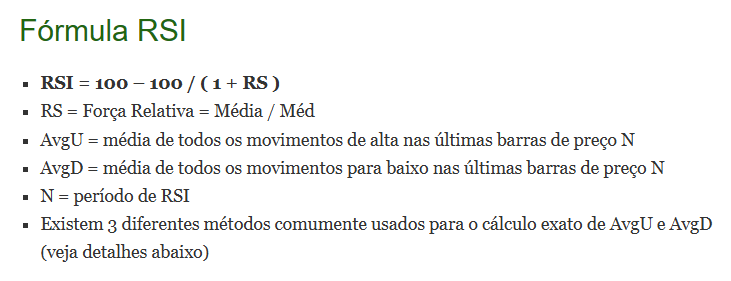

- https://www.macroption.com/rsi-calculation/


Cálculo do RSI passo a passo:

1. Calcular movimentos para cima e para baixo (obter você e D)
2. Média dos movimentos para cima e para baixo (obter AvgU e AvgD)
3. Calcular Força Relativa (obter RS)
4. Calcular o Índice de Força Relativa (obter RSI)

- O RSI é normalmente expresso em uma escala de 0 a 100.

- Valores acima de 70 podem indicar que o ativo está sobrecomprado, enquanto valores abaixo de 30 podem indicar que está sobrevendido.

In [7]:
periodos = 21 # Define o número de períodos a serem considerados para o cálculo do RSI.

close_delta = df['close'] / df['close'].shift(1) - 1 # Calcula a variação percentual dos preços de fechamento em relação ao período anterior.

up = close_delta.clip(lower=0) # Cria uma série que contém apenas os valores positivos de close_delta. Se a variação for negativa, o valor é substituído por zero.
down = -1 * close_delta.clip(upper=0) # Cria uma série que contém apenas os valores negativos de close_delta, multiplicados por -1. Se a variação for positiva, o valor é substituído por zero.

ma_up = up.rolling(window = periodos).mean() #  Calcula a média móvel dos ganhos (valores positivos) ao longo de um período definido
ma_down = down.rolling(window = periodos).mean() # Calcula a média móvel das perdas (valores negativos) ao longo do mesmo período definido

rsi = ma_up / ma_down # Calcula a razão entre a média móvel dos ganhos e a média móvel das perdas.
df["rsi"] = 100 - (100/(1 + rsi)) # Calcula o valor final do RSI usando a fórmula padrão.

### 2.1 Tranformando o calculo do indicador em uma função

In [8]:
def get_rsi(window):
        
# Cálculo do RSI

    close_delta = df["close"] / df["close"].shift(1) - 1

    up = close_delta.clip(lower=0)
    down = -1 * close_delta.clip(upper=0)

    ma_up = up.rolling(window = window).mean()
    ma_down = down.rolling(window = window).mean()

    rsi = ma_up / ma_down
    rsi = 100 - (100/(1 + rsi))

    return rsi

### 2.2 Visualizando no gráfico

In [9]:
# Criando uma figura e o gráfico de candles dos dados de PETR4
fig = make_subplots(rows=2, cols=1, row_heights=[0.7, 0.3], vertical_spacing=0.02, shared_xaxes=True)
fig.add_trace(go.Candlestick(x=df.index,
                             open=df['open'],
                             high=df['high'],
                             low=df['low'],
                             close=df['close'],
                             name="PETR4"), row=1, col=1)

# Adcionaco um subplot na figura para visualizar candles e o indicador ao mesmo tempo
fig.add_trace(go.Scatter(x=df.index,
                         y=df['rsi'],
                         name="RSI"), row=2, col=1)

# Esconde as horas fora do intervalo de 9h às 17h e os fins de semana (Sábado e Domingo)
fig.update_xaxes(rangebreaks=[
dict(bounds=[18, 10], pattern="hour"), #hide hours outside of 9am-5pm
dict(bounds=["sat", "mon"]), #hide weekends
])

fig.update_layout(xaxis_rangeslider_visible=False, height=600)
fig.show()

---
## 3. Backtestando

- Um backtest deve ser encarado como uma função que recebe parâmetros e devolve trades executados.

### 3.1 Parâmetros

In [32]:
window = 14
up_exit = 70
down_entry = 30
bet_size = 100

### 3.2 Estratégia

Quremos:

- Comprar quando o indicador RSI mostrar que o ativo está em níveis de sobrevenda (down_entry <= 30)
- Encerrar a operação quando o RSI mostrar que o atvio está sendo negociado em níveis de sobrecompra (up_exit >= 70).

In [11]:
df["rsi"] = get_rsi(window)

dict_trades = [] # Armazenar informações sobre os negócios executados.

t = 0 # Controlar se estamos em uma posição comprada (1) ou não (0).

for idx, row in df.iterrows(): 
    if row['rsi'] <= down_entry and t == 0: # Verifica se o valor do RSI é menor ou igual ao limite inferior e se possuimos uma posição comprada.
        dict_trades += [{'price': row['close'], 'time': idx, 'kind': 'buy','quantity': bet_size}]
        
        t = 1 # Controlar se estamos em uma posição comprada (1) ou não (0).

    elif row['rsi'] > up_exit and t == 1: # Verifica se o valor do RSI é maior que o limite superior e se possuímos uma posição comprada.
        dict_trades += [{'price': row['close'], 'time': idx, 'kind': 'sell','quantity': -bet_size}]
        
        t = 0 # Controlar se estamos em uma posição comprada (1) ou não (0).
        
df_trades_raw = pd.DataFrame(dict_trades).set_index('time') # Armazenando os trades executados em um novo dataframe

df_buys = df_trades_raw[df_trades_raw['kind'] == 'buy'] # Cria um DataFrame df_buys contendo apenas as operações de compra.
df_sells = df_trades_raw[df_trades_raw['kind'] == 'sell'] # Cria um DataFrame df_sells contendo apenas as operações de venda.

### 3.3 Visualizando no gráfico

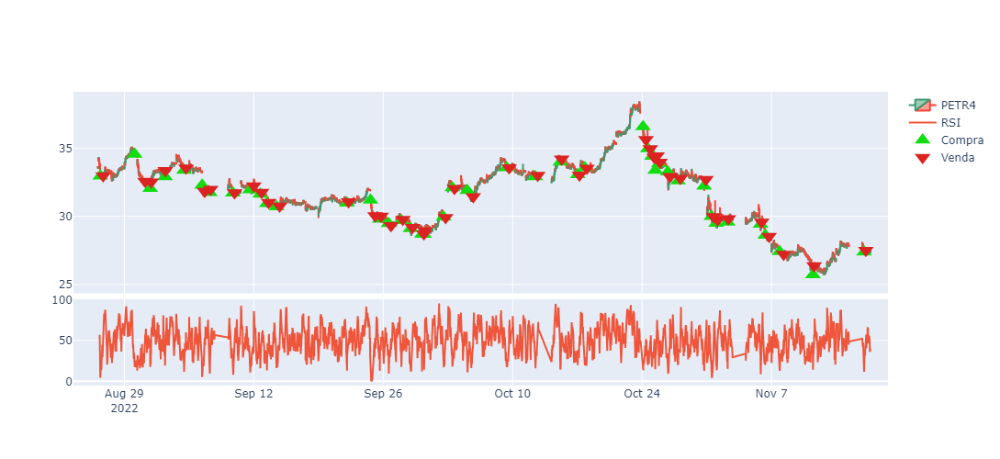

In [12]:
fig = make_subplots(rows=2, cols=1, row_heights=[0.7, 0.3], vertical_spacing=0.02, shared_xaxes=True)

fig.add_trace(go.Candlestick(x=df.index,
open=df['open'],
high=df['high'],
low=df['low'],
close=df['close'], name = 'PETR4'), row=1, col=1)

fig.add_trace(go.Scatter(x=df.index,
y=df['rsi'], name = 'RSI'), row=2, col=1)

fig.add_trace(go.Scatter(x=df_buys.index,y=df_buys['price'],marker_color='#11dd11', marker_size=15,
mode="markers", marker_symbol= 'triangle-up', name = 'Compra'), row=1, col=1)

fig.add_trace(go.Scatter(x=df_sells.index,y=df_sells['price'],marker_color='#dd2222', marker_size=15,
mode="markers", marker_symbol= 'triangle-down', name = 'Venda'), row=1, col=1)

fig.update_xaxes(rangebreaks=[
dict(bounds=[18, 10], pattern="hour"), #hide hours outside of 9am-5pm
dict(bounds=["sat", "mon"]), #hide weekends
])

fig.update_layout(xaxis_rangeslider_visible=False, height=500)
fig.show()

---
## 4. Marcação à mercado (Curva de Capital)

- Através desta curva de capital podemos visualizar como o capital supostamente alocado em cada operação teria se comportado e qual seria o resultado das operações.
- Estamos lucrando ou perdendo? A curva irá nos mostrar o desempenho da estratégia

In [13]:
df_trades = df_trades_raw.join(df["close"], how='outer')

df_trades["position"] = df_trades["quantity"].shift(1).fillna(0).cumsum()

In [14]:
df_trades['quantity'].value_counts()

quantity
 100.0    44
-100.0    44
Name: count, dtype: int64

### 4.1 Posições executadas

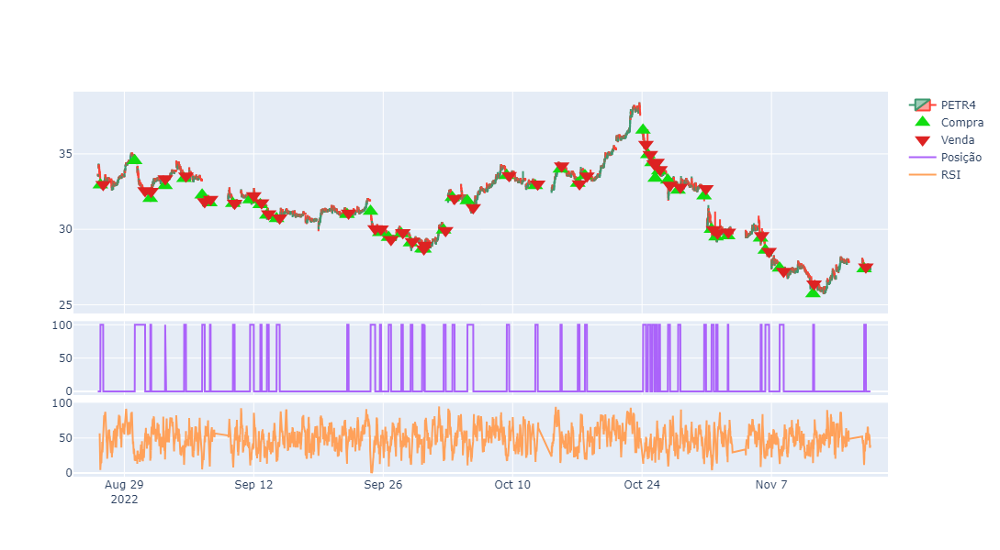

In [15]:
fig = make_subplots(rows=3, cols=1, row_heights=[0.6, 0.2, 0.2],vertical_spacing=0.02, shared_xaxes=True)

fig.add_trace(go.Candlestick(x=df.index,
open=df['open'],
high=df['high'],
low=df['low'],
close=df['close'], name = 'PETR4'), row=1, col=1)

fig.add_trace(go.Scatter(x=df_buys.index,y=df_buys['price'],marker_color='#11dd11', marker_size=15,
mode="markers", marker_symbol= 'triangle-up', name = 'Compra'), row=1, col=1)

fig.add_trace(go.Scatter(x=df_sells.index,y=df_sells['price'],marker_color='#dd2222', marker_size=15,
mode="markers", marker_symbol= 'triangle-down', name = 'Venda'), row=1, col=1)

fig.add_trace(go.Scatter(x=df.index,
y=df_trades['position'], name = 'Posição'), row=2, col=1)

fig.add_trace(go.Scatter(x=df.index,
y=df['rsi'], name = 'RSI'), row=3, col=1)

fig.update_xaxes(rangebreaks=[
dict(bounds=[18, 10], pattern="hour"), #hide hours outside of 9am-5pm
dict(bounds=["sat", "mon"]), #hide weekends
])

fig.update_layout(xaxis_rangeslider_visible=False, height=600)
fig.show()

### 4.2 Retorno Cumulativo (curva de capital)

In [16]:
df_trades["ret_market"] = df_trades["close"] - df_trades["close"].shift(1)
df_trades["ret"] = df_trades["ret_market"] * df_trades["position"]
df_trades["ret_cum"] = df_trades["ret"].cumsum()

In [17]:
df_trades[(df_trades["position"] == 0) & (df_trades["position"].shift(1) > 0)]

,price,kind,quantity,close,position,ret_market,ret,ret_cum
2022-08-25 13:00:00,NaN,NaN,NaN,33.03,0.0,0.05,0.0,3.0
2022-08-30 14:55:00,NaN,NaN,NaN,32.53,0.0,-0.04,-0.0,-196.0
2022-08-31 10:40:00,NaN,NaN,NaN,32.75,0.0,0.23,0.0,-149.0
2022-09-01 11:25:00,NaN,NaN,NaN,33.39,0.0,0.03,0.0,-103.0
2022-09-02 16:10:00,NaN,NaN,NaN,33.42,0.0,-0.12,-0.0,-86.0
2022-09-06 11:45:00,NaN,NaN,NaN,31.95,0.0,0.12,0.0,-131.0
2022-09-06 15:25:00,NaN,NaN,NaN,31.94,0.0,-0.04,-0.0,-108.0
2022-09-08 14:15:00,NaN,NaN,NaN,31.72,0.0,-0.01,-0.0,-106.0
2022-09-12 10:05:00,NaN,NaN,NaN,32.69,0.0,0.46,0.0,-78.0
2022-09-12 14:55:00,NaN,NaN,NaN,31.74,0.0,-0.02,-0.0,-65.0


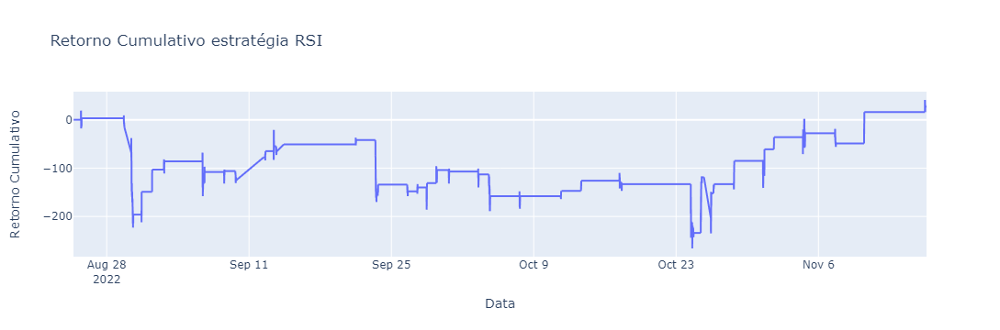

In [18]:
import plotly.express as px

fig = px.line(df_trades, x=df_trades.index, y='ret_cum', title='Retorno Cumulativo estratégia RSI')
fig.update_layout(xaxis_title='Data', yaxis_title='Retorno Cumulativo')
fig.show()

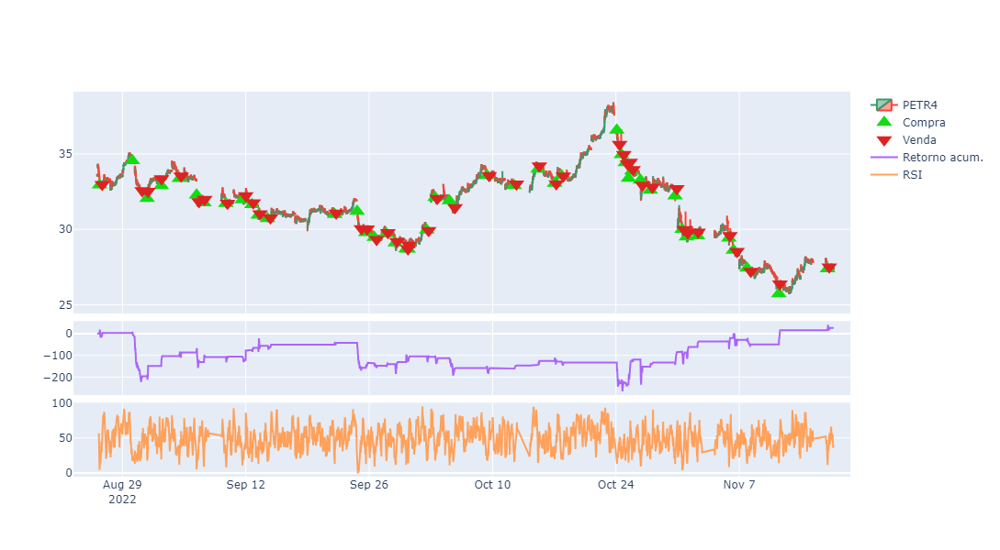

In [19]:
fig = make_subplots(rows=3, cols=1, row_heights=[0.6, 0.2, 0.2],vertical_spacing=0.02, shared_xaxes=True)

fig.add_trace(go.Candlestick(x=df.index,
open=df['open'],
high=df['high'],
low=df['low'],
close=df['close'], name = 'PETR4'), row=1, col=1)

fig.add_trace(go.Scatter(x=df_buys.index,y=df_buys['price'],marker_color='#11dd11', marker_size=15,
mode="markers", marker_symbol= 'triangle-up', name = 'Compra'), row=1, col=1)

fig.add_trace(go.Scatter(x=df_sells.index,y=df_sells['price'],marker_color='#dd2222', marker_size=15,
mode="markers", marker_symbol= 'triangle-down', name = 'Venda'), row=1, col=1)

fig.add_trace(go.Scatter(x=df.index,
y=df_trades['ret_cum'], name = 'Retorno acum.'), row=2, col=1)
              
fig.add_trace(go.Scatter(x=df.index,
y=df['rsi'], name = 'RSI'), row=3, col=1)
              
fig.update_xaxes(rangebreaks=[
dict(bounds=[18, 10], pattern="hour"), #hide hours outside of 9am-5pm
dict(bounds=["sat", "mon"]), #hide weekends
])
              
fig.update_layout(xaxis_rangeslider_visible=False, height=600)
fig.show()

---
## 5. Mensuração de Performance

- Drowndown
- Underwater period
- Índice sharpe

### Drawdown

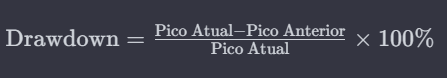

- É a medida da perda máxima que um investidor teria experimentado desde o último ponto mais alto do portfólio até o próximo ponto mais alto.
- O drawdown é expresso como uma porcentagem e é frequentemente usado como uma métrica importante para avaliar o risco associado a um determinado investimento ou estratégia.

In [20]:
initial_capital = 5000
df_trades["ret_cum"] = initial_capital + df_trades["ret"].cumsum()

In [21]:
df_trades["max_cum"] = df_trades["ret_cum"].cummax()
df_trades["drawdown"] = df_trades["ret_cum"] / df_trades["max_cum"] - 1

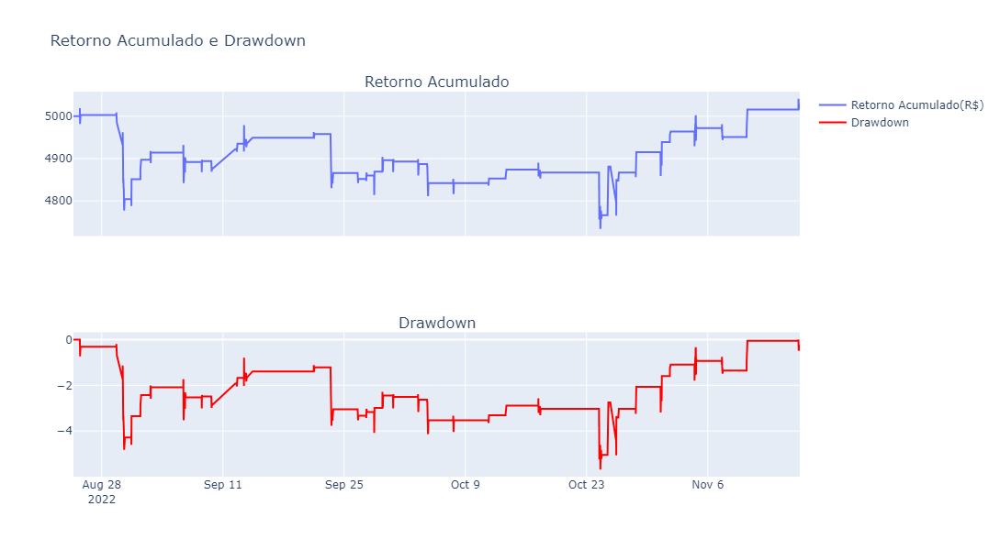

In [22]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=['Retorno Acumulado', 'Drawdown'])

# Adiciona o gráfico de retorno acumulado à primeira linha
fig.add_trace(go.Scatter(x=df_trades.index, y=df_trades['ret_cum'], mode='lines', name='Retorno Acumulado(R$)'), row=1, col=1)

# Adiciona o gráfico de drawdown à segunda linha
fig.add_trace(go.Scatter(x=df_trades.index, y=df_trades['drawdown'] * 100, mode='lines', line=dict(color='red'), name='Drawdown'), row=2, col=1)

# Configuração do layout
fig.update_layout(title_text='Retorno Acumulado e Drawdown', height=600, showlegend=True)

# Exibição do gráfico interativo
fig.show()

### Underwater period

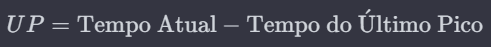

- Conceito usado em finanças para descrever o tempo decorrido desde o último pico em um investimento até que ele retorne ao seu valor anterior ou atinja um novo pico.
- Em outras palavras, é o período de tempo durante o qual um investimento permanece abaixo do seu ponto mais alto anterior.

In [23]:
initial_capital = 5000
df_trades["ret_cum"] = initial_capital + df_trades["ret"].cumsum()
df_trades["max_cum"] = df_trades["ret_cum"].cummax()
df_trades['underwater'] = df_trades['ret_cum'] < df_trades['max_cum']

In [24]:
print('--------------------------' * 2)
print('-> O underwater period da estratégia foi de: {:.2f}'.format(df_trades["underwater"].sum() * 5 / 60 / 24))
print('--------------------------' * 2)

----------------------------------------------------
-> O underwater period da estratégia foi de: 17.28
----------------------------------------------------


- **OBS:** Este número significa que, ao longo do período analisado, a estratégia passou aproximadamente 17.27 dias em que o valor cumulativo estava abaixo do valor mais alto anterior (pico). Em outras palavras, durante esses 17.27 dias, a estratégia não conseguiu recuperar completamente as perdas e voltar ao seu ponto mais alto anterior.

### Índice Sharpe

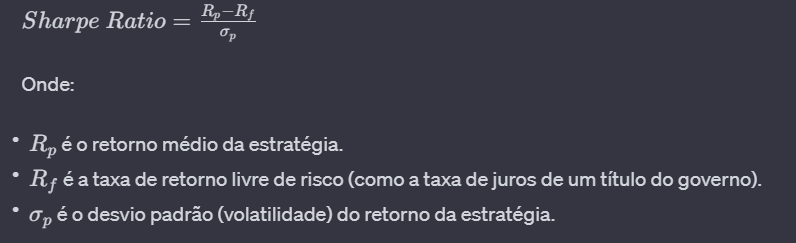


- É uma medida de desempenho ajustada ao risco que calcula o retorno em excesso de um investimento em relação a um ativo livre de risco por unidade de volatilidade.
- Ele é frequentemente utilizado para avaliar o retorno ajustado ao risco de uma estratégia de investimento.
- Um Sharpe Ratio mais alto geralmente sugere um desempenho mais atraente, pois implica um retorno superior em relação à volatilidade.

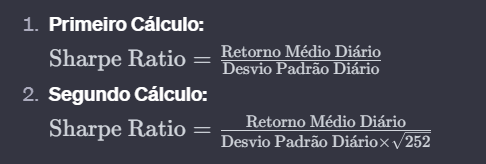

In [25]:
df_trades.index = pd.to_datetime(df_trades.index)

- **1° Cálculo:**

In [26]:
df_trades["ret"].groupby(df_trades.index.date).sum().mean() / df_trades["ret"].groupby(df_trades.index.date).sum().std()

0.012067079048783113

- **OBS:** O índice de Sharpe de -0.0882 sugere que, em média, o retorno da estratégia não está sendo compensado adequadamente pela volatilidade (risco) associada à estratégia. Isso pode indicar que o retorno não é suficiente para compensar o nível de risco assumido.

- **2: Cálculo:**

In [27]:
df_trades["ret"].groupby(df_trades.index.date).sum().mean() / df_trades["ret"].groupby(df_trades.index.date).sum().std() * (252 ** 0.5)

0.19155894128422785

- **OBS:** No seu segundo cálculo, o valor resultante de -1.4001 indica que o retorno médio ajustado ao risco (volatilidade) é negativo. Quando você multiplica o desvio padrão diário dos retornos pelo termo (252 ** 0.5), está ajustando o desvio padrão para refletir uma medida de volatilidade anualizada.

---
## 6. Otimização de Parâmetros
### 6.1 Método de varredura
- Vamos executar a estratégia em diferentes parâmetros e printar a janela, entrada, saída e o sharpe

In [28]:
def get_rsi(window):
    close_delta = df["close"] / df["close"].shift(1) - 1
    up = close_delta.clip(lower=0)
    down = -1 * close_delta.clip(upper=0)
    ma_up = up.rolling(window = window).mean()
    ma_down = down.rolling(window = window).mean()
    rsi = ma_up / ma_down
    rsi = 100 - (100/(1 + rsi))
    return rsi


In [29]:
# Parâmetros
bet_size = 100
dict_varr = []

for window in [14, 21]:
    for up_exit in [60, 70, 80]:
        for down_entry in [20, 30, 40]:
            df["rsi"] = get_rsi(window)
            dict_trades = []
            t = 0
            for idx, row in df.iterrows():
                if row['rsi'] <= down_entry and t == 0:
                    dict_trades += [{'price': row['close'], 'time': idx, 'kind':'buy', 'quantity': bet_size}]
                    t = 1
                    
                elif row['rsi'] > up_exit and t == 1:
                    dict_trades += [{'price': row['close'], 'time': idx, 'kind':'sell', 'quantity': -bet_size}]
                    t = 0
                    
# Mensuração de estratégias
            df_trades_raw = pd.DataFrame(dict_trades).set_index('time')
            df_trades = df_trades_raw.join(df["close"], how='outer')
            df_trades["position"] = df_trades["quantity"].shift(1).fillna(0).cumsum()
            df_trades["ret_market"] = df_trades["close"] - df_trades["close"].shift(1)
            df_trades["ret"] = df_trades["ret_market"] * df_trades["position"]
            df_trades["ret_cum"] = df_trades["ret"].cumsum()
            df_trades.index = pd.to_datetime(df_trades.index)
            sharpe = df_trades["ret"].groupby(df_trades.index.date).sum().mean() / df_trades["ret"].groupby(df_trades.index.date).sum().std() * (252** 0.5)
            print(f"Window: {window}, up_exit: {up_exit}, down_entry:{down_entry} -> sharpe: {sharpe}")
            dict_varr += [{'window': window, 'up_exit': up_exit, 'down_entry':down_entry, 'sharpe': sharpe}]

Window: 14, up_exit: 60, down_entry:20 -> sharpe: -0.431016778599111
Window: 14, up_exit: 60, down_entry:30 -> sharpe: -2.927110199057547
Window: 14, up_exit: 60, down_entry:40 -> sharpe: -2.105782040938355
Window: 14, up_exit: 70, down_entry:20 -> sharpe: -0.045266386811597295
Window: 14, up_exit: 70, down_entry:30 -> sharpe: -1.4001436499059219
Window: 14, up_exit: 70, down_entry:40 -> sharpe: -1.493202112904001
Window: 14, up_exit: 80, down_entry:20 -> sharpe: -2.135437216978883
Window: 14, up_exit: 80, down_entry:30 -> sharpe: -2.9092059206377114
Window: 14, up_exit: 80, down_entry:40 -> sharpe: -2.72527385398574
Window: 21, up_exit: 60, down_entry:20 -> sharpe: -0.8309273810834457
Window: 21, up_exit: 60, down_entry:30 -> sharpe: -0.1899286782880745
Window: 21, up_exit: 60, down_entry:40 -> sharpe: -1.1813611387323404
Window: 21, up_exit: 70, down_entry:20 -> sharpe: -1.2856825367913527
Window: 21, up_exit: 70, down_entry:30 -> sharpe: -0.23928582800628498
Window: 21, up_exit: 70,

In [30]:
df_varr = pd.DataFrame(dict_varr)

<Axes: xlabel='up_exit', ylabel='window'>

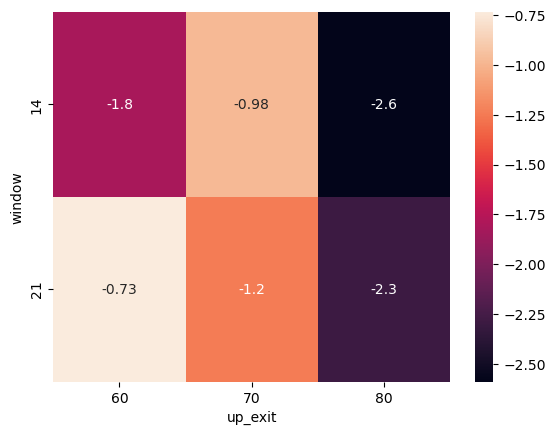

In [31]:
import seaborn as sns
sns.heatmap(df_varr.pivot_table(index="window", columns="up_exit",values="sharpe"), annot=True)
